In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data import Dataset, DataLoader

In [ ]:
## Use GPU if available, else use CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
import numpy as np
import random
import numpy.random as npr
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.metrics import accuracy_score
import collections
from matplotlib import offsetbox
from PIL import Image
import pickle
import cv2
import time
import os
import copy
import math
from time import time
import warnings
%matplotlib inline
plt.style.use('bmh')
warnings.filterwarnings('ignore')

In [ ]:
X = np.load('data_train.npy').T
T = np.load('t_train.npy')

print(X.shape, T.shape)

(9032, 90000) (9032,)


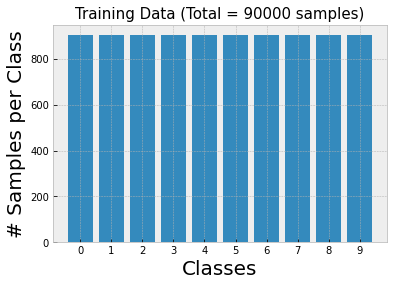

In [ ]:
# Counting number samples per class
vals, counts = np.unique(T, return_counts=True)

plt.bar(vals, counts)
plt.xticks(range(10), range(10))
plt.xlabel('Classes', size=20)
plt.ylabel('# Samples per Class', size=20)
plt.title('Training Data (Total = ' + str(X.shape[1]) + ' samples)', size=15);

In [ ]:
class_labels = np.unique(T.ravel())

In [ ]:
T_arg_sorted = T.ravel().argsort()

T_sorted = T.ravel()[T_arg_sorted]
result = []

for i in class_labels:
 label_indices = np.where(T_sorted.ravel() == i)
 min_index, max_index = (np.min(label_indices), np.max(label_indices)) 
 result.append((min_index, max_index))

X_sorted = X[T_arg_sorted, :]
T_sorted = T_sorted.reshape(-1, 1)

print(result)
print("Now it is clear, that we have sorted the data based on target labels")

[(0, 902), (903, 1805), (1806, 2708), (2709, 3612), (3613, 4515), (4516, 5418), (5419, 6322), (6323, 7225), (7226, 8128), (8129, 9031)]
Now it is clear, that we have sorted the data based on target labels


In [ ]:
DIR = os.getcwd()
np.save(file=os.path.join(DIR, 'X_train_sorted.npy'), arr=X_sorted)
np.save(file=os.path.join(DIR, 'T_train_sorted.npy'), arr=T_sorted)

In [ ]:
X_train1 = np.load('X_train_sorted.npy')
t_train = np.load('t_train_correct.npy')

print(X_train1.shape, t_train.shape)

(9032, 90000) (9032, 1)


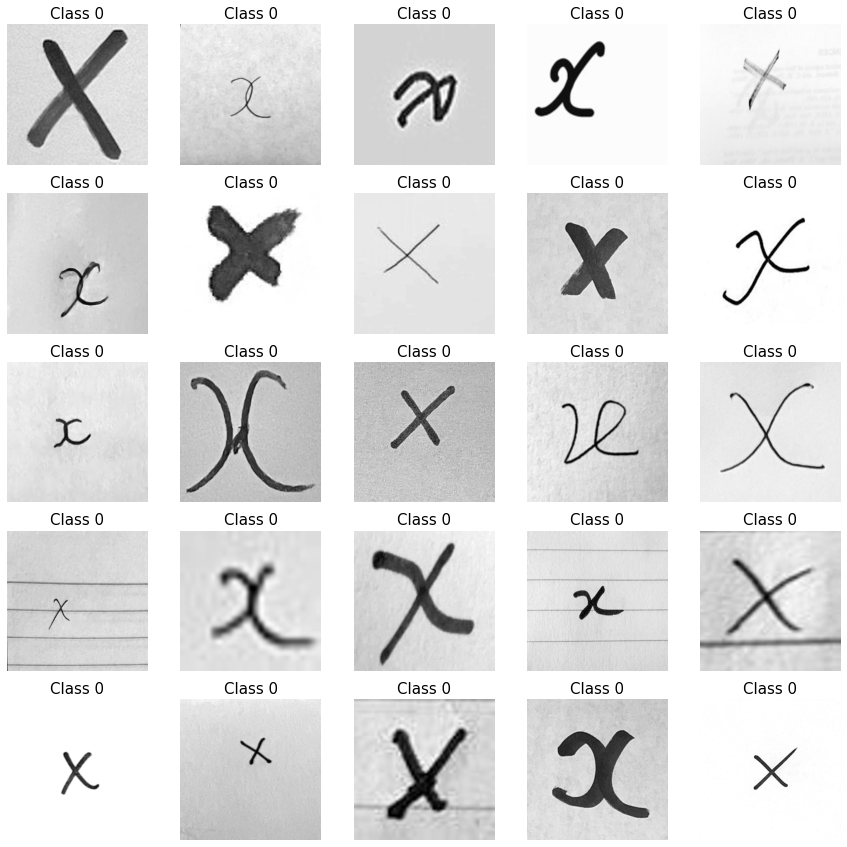

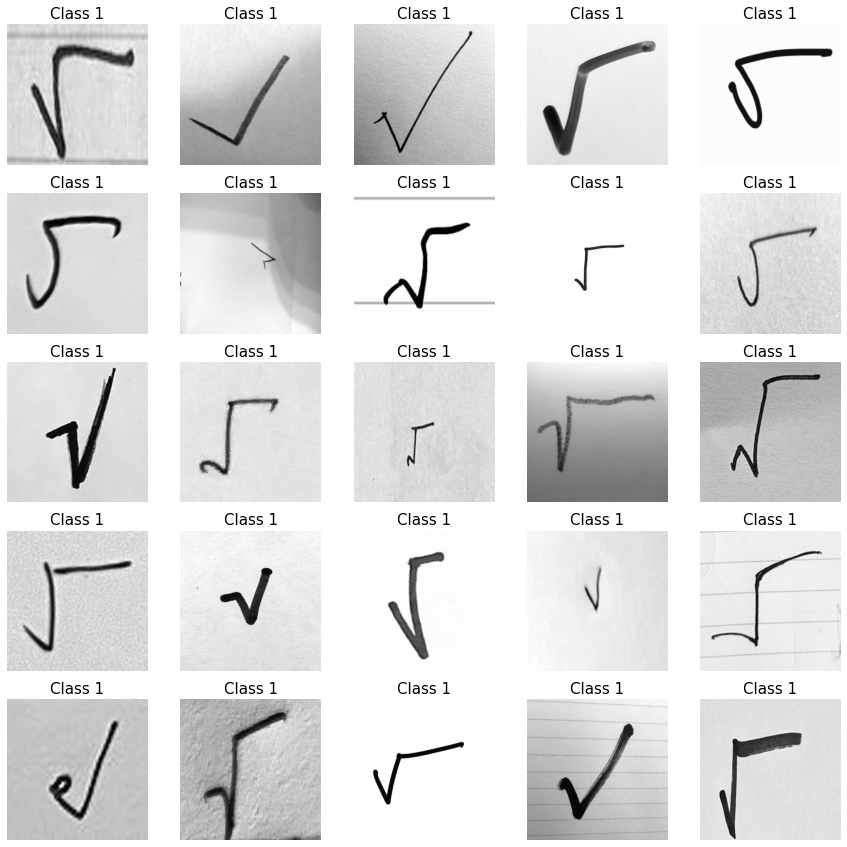

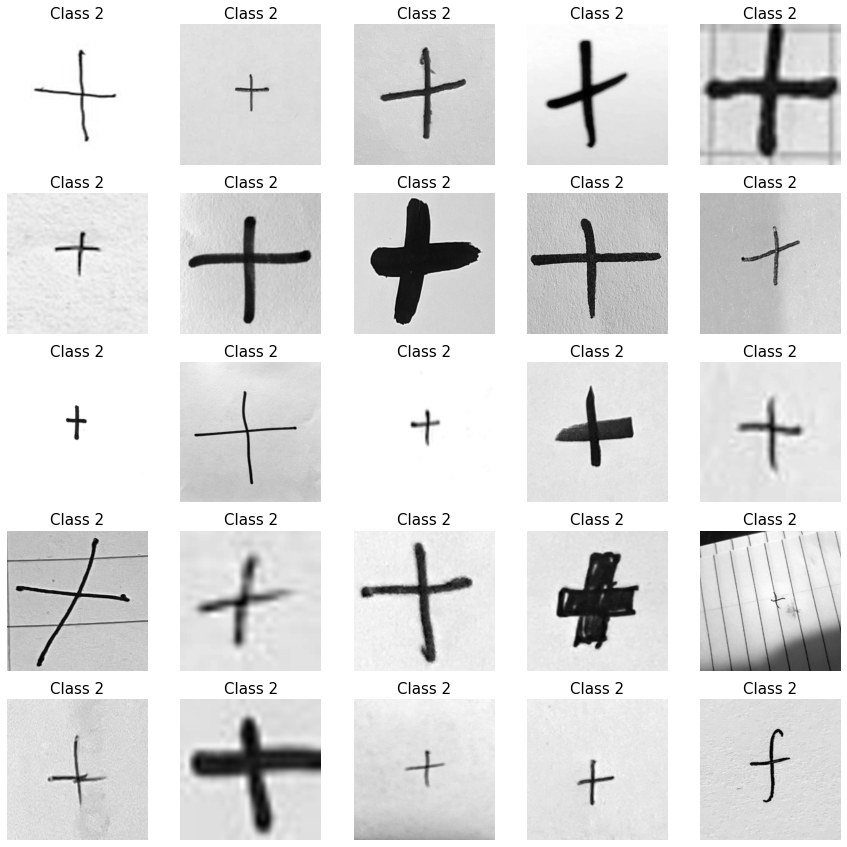

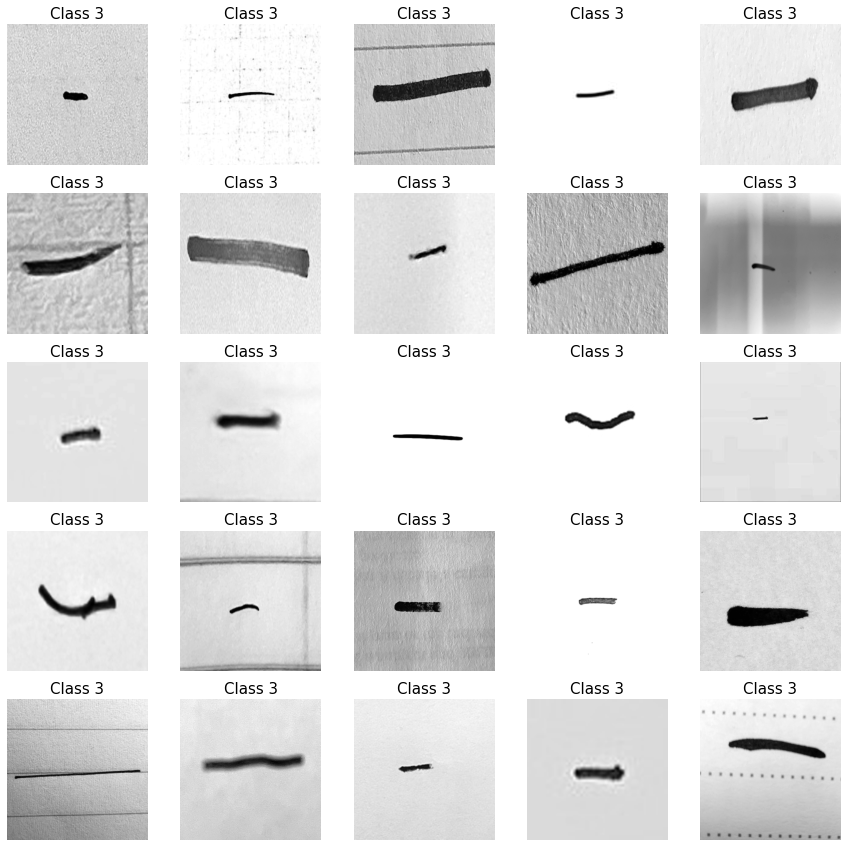

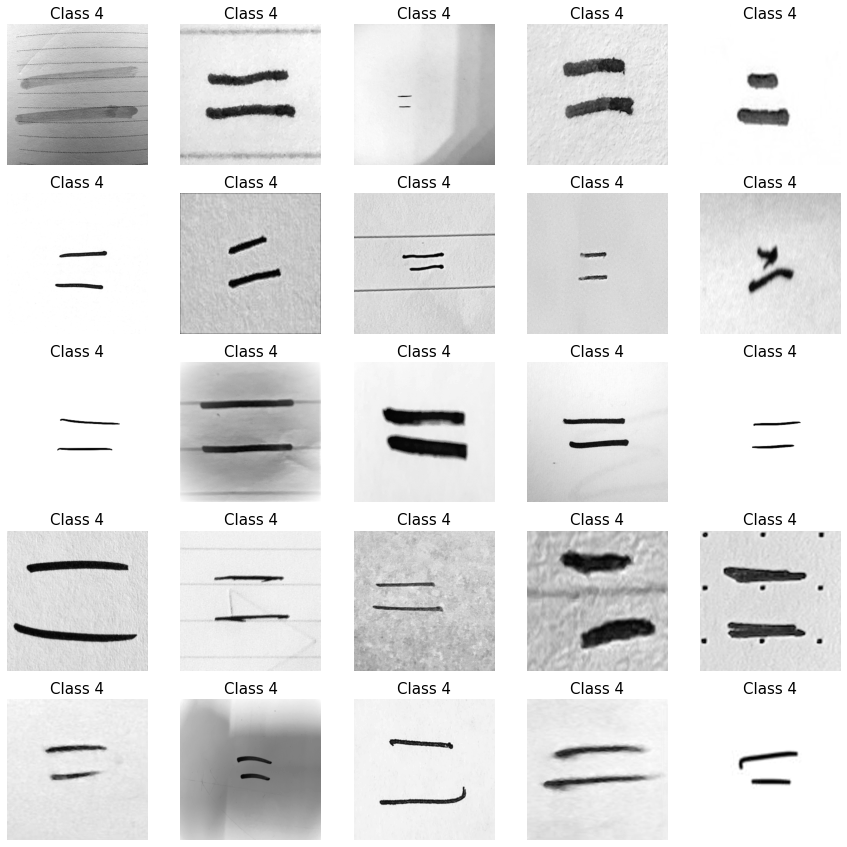

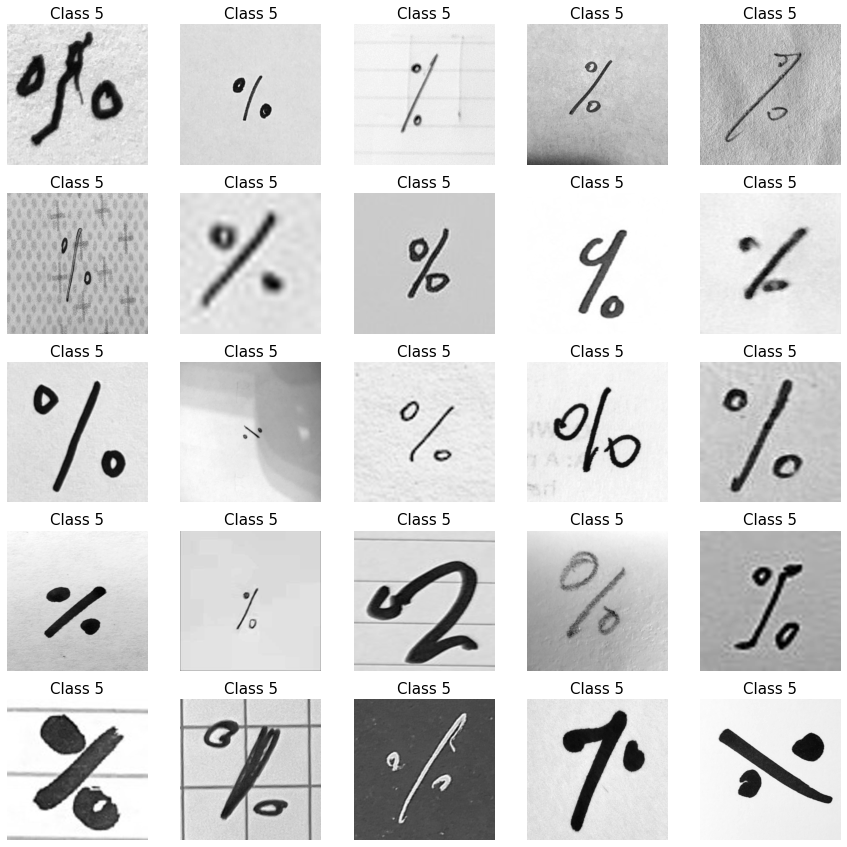

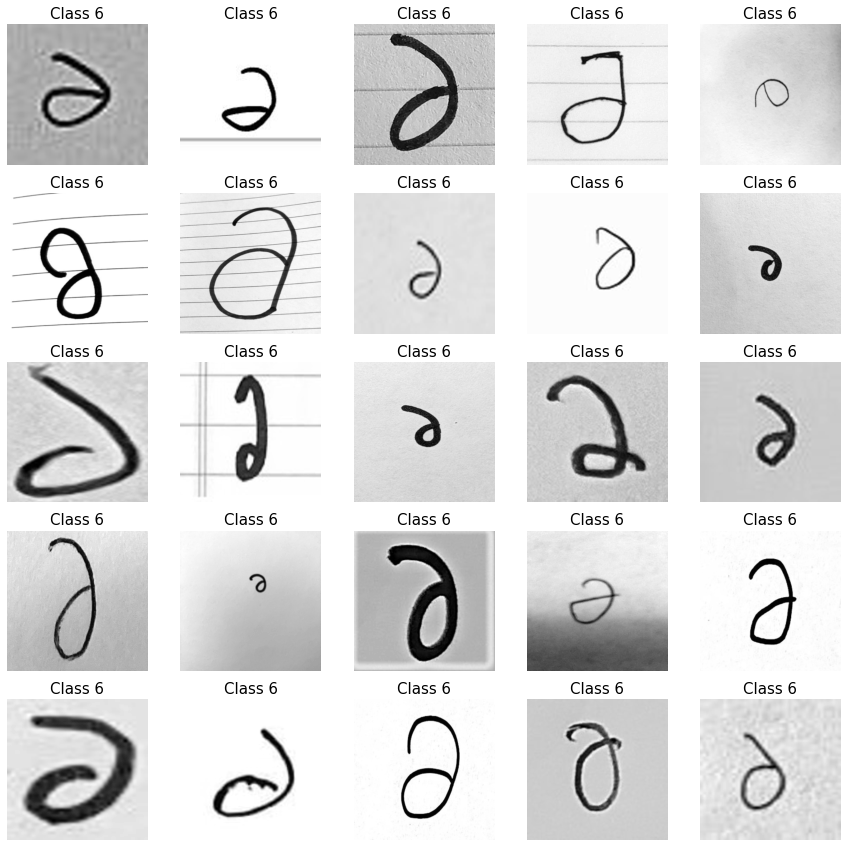

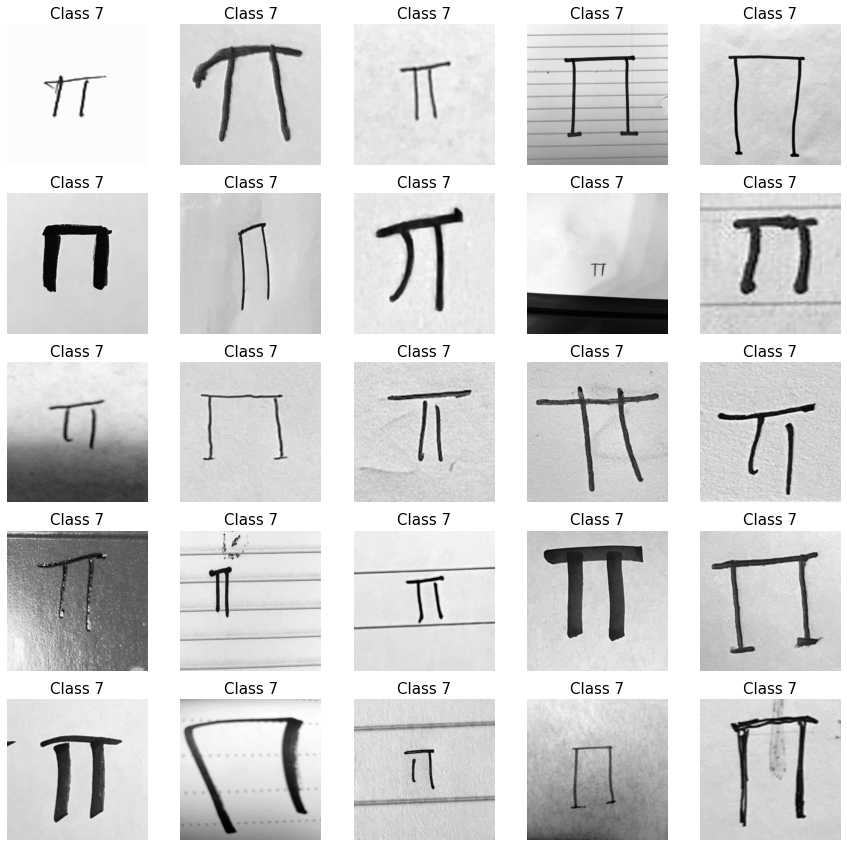

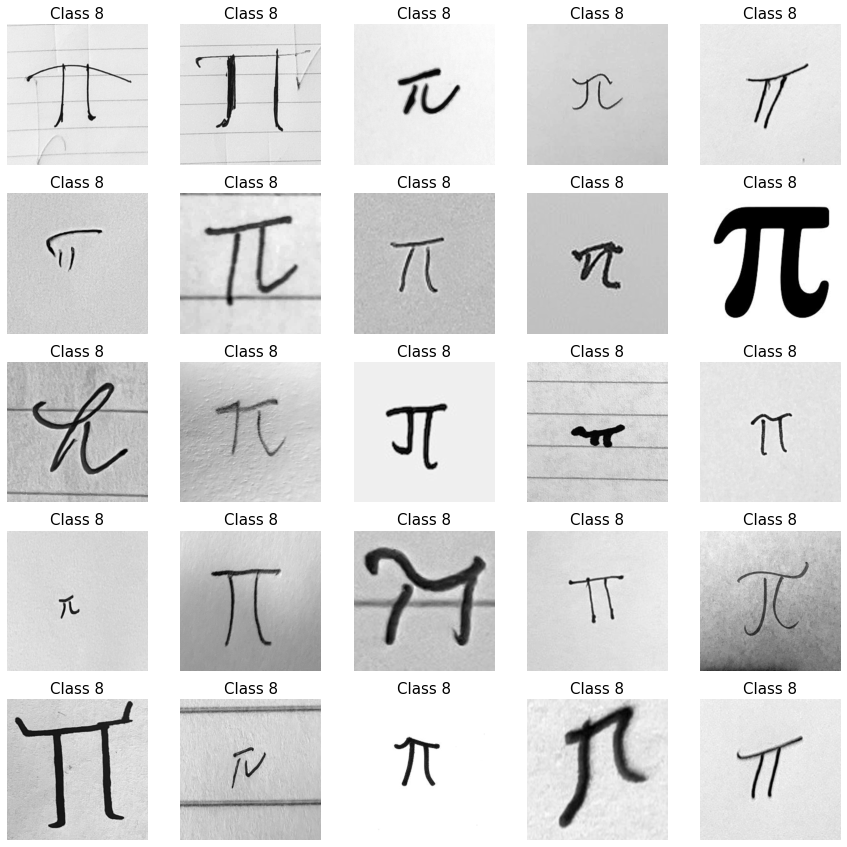

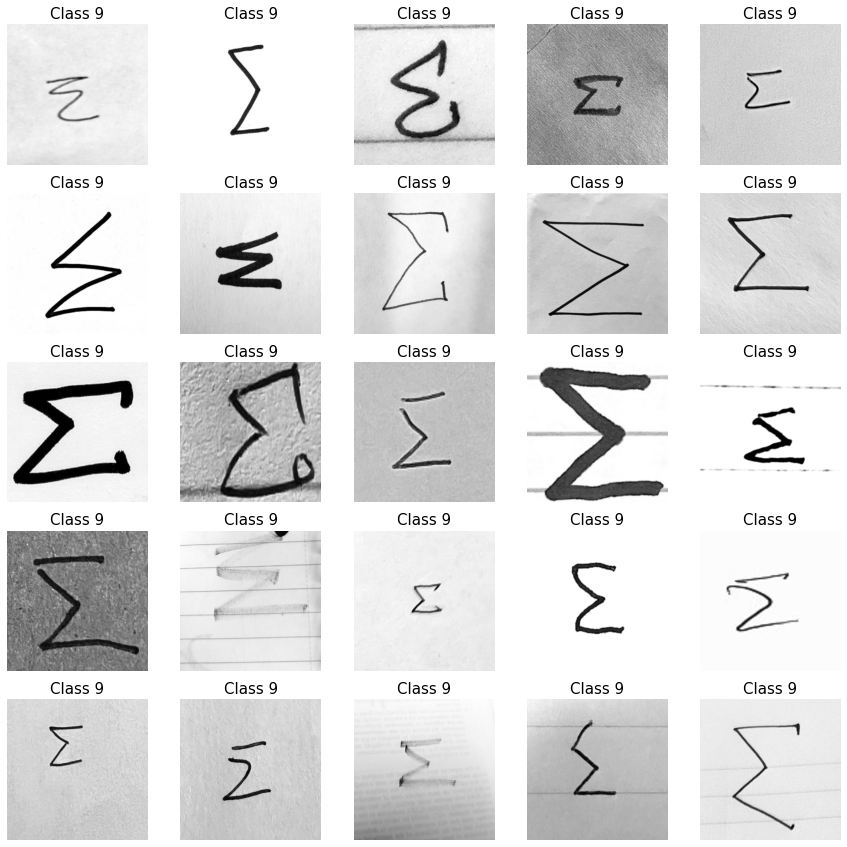

In [ ]:
# Displaying some random examples per class

for i in range(0,10):
    rnd_sample = np.random.permutation(np.where(t_train==i)[0])
    fig=plt.figure(figsize=(15,15))
    for j in range(25):
        fig.add_subplot(5,5,j+1)
        plt.imshow(X_train1[rnd_sample[j],:].reshape((300,300)),cmap='gray')
        plt.axis('off');plt.title('Class '+str(int(t_train[rnd_sample[j]])),size=15)
    plt.show()

In [ ]:
img=[]
for i in X_train1:
  imag = np.reshape(i, (300, 300))
  imag=Image.fromarray(imag)
  imag = imag.resize((100,100))
  imag = np.array(imag)
  img.append(imag)
img =np.array(img)

In [ ]:
sh =X_train1.shape[0]
X = img.reshape(sh,100*100)

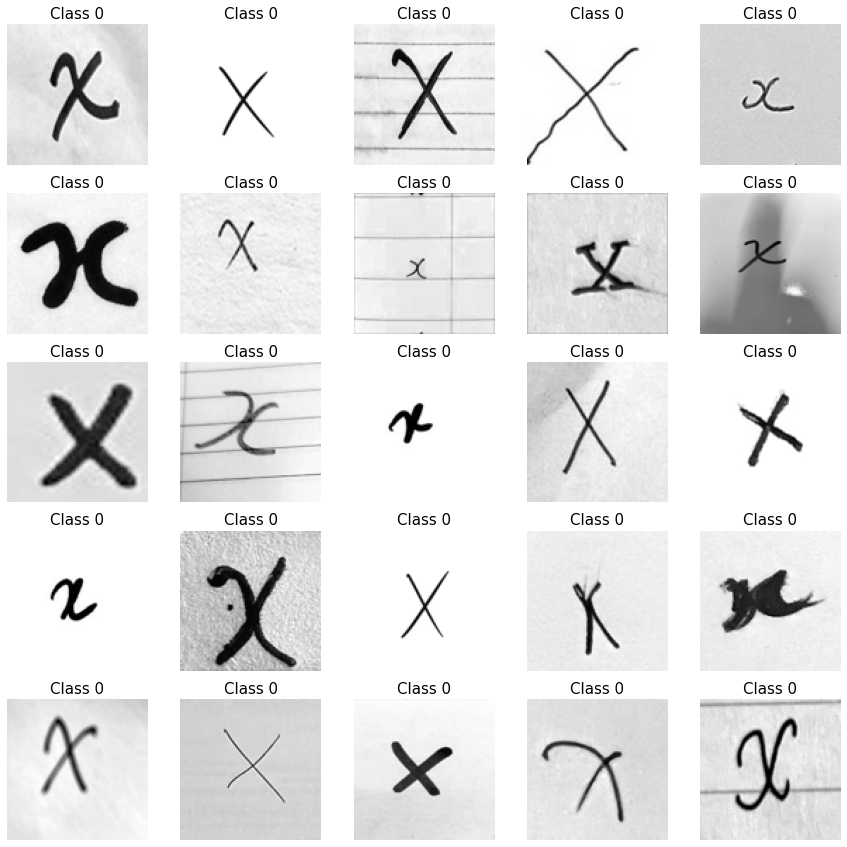

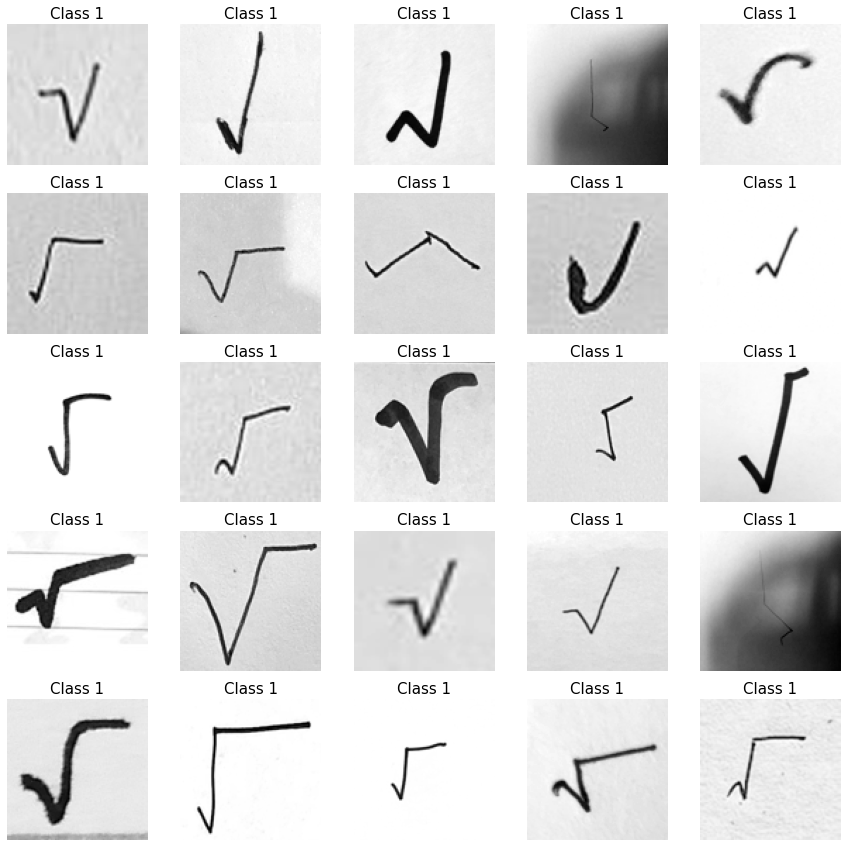

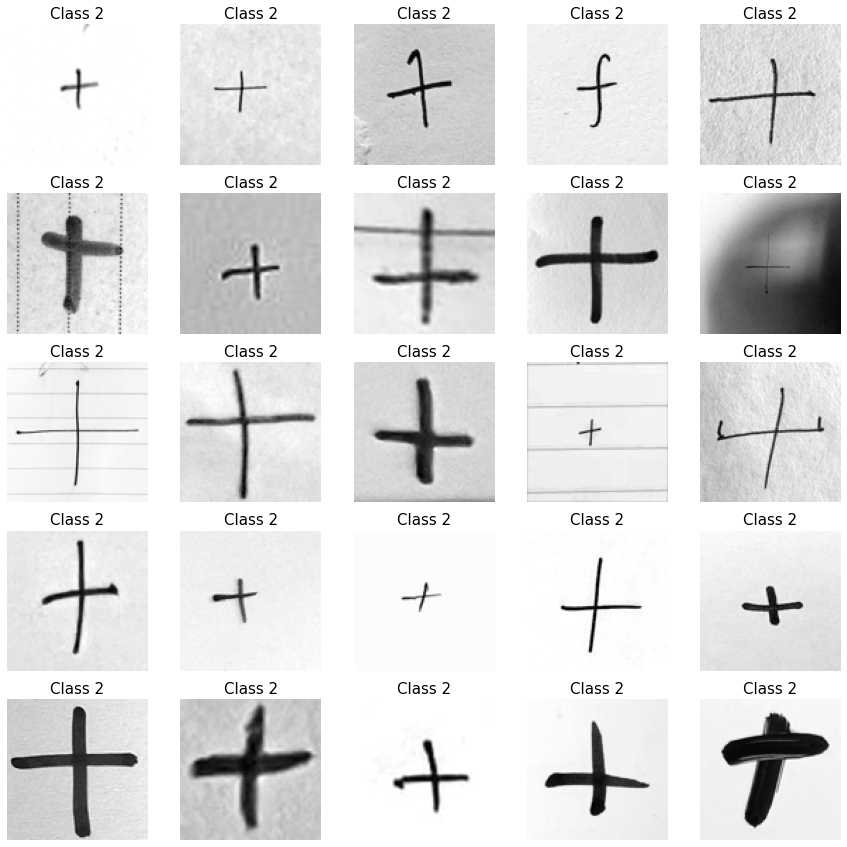

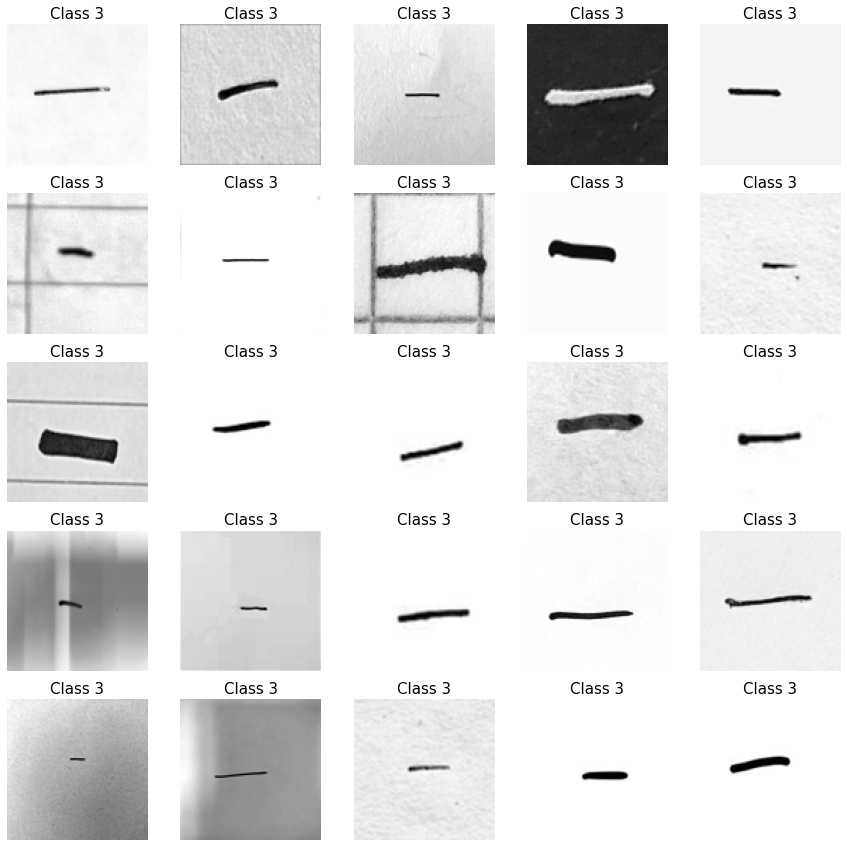

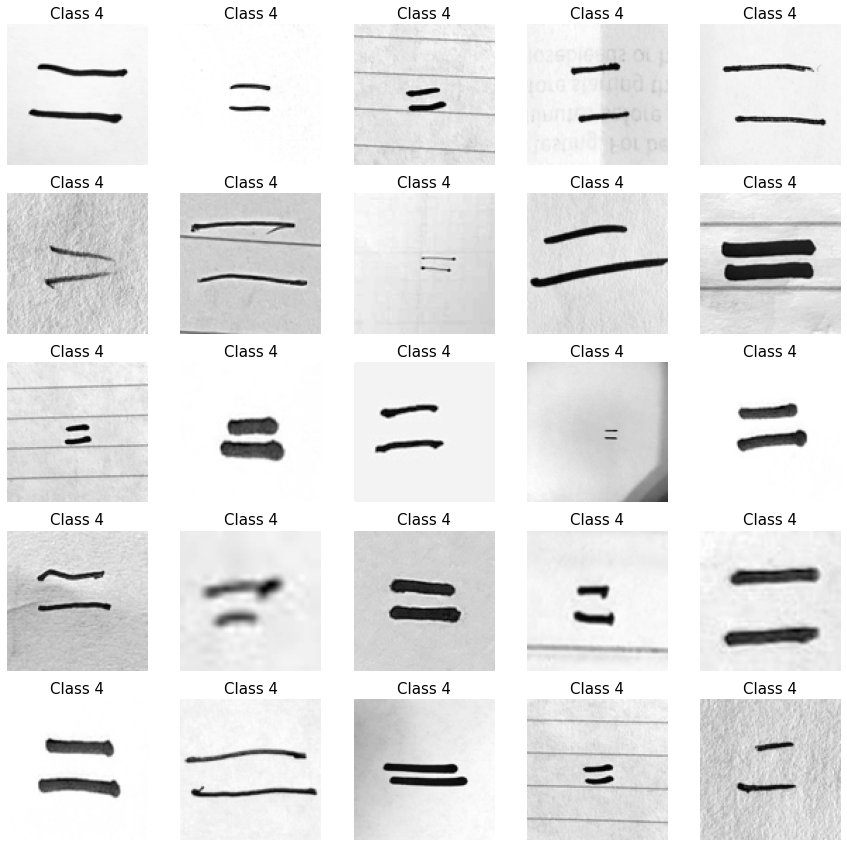

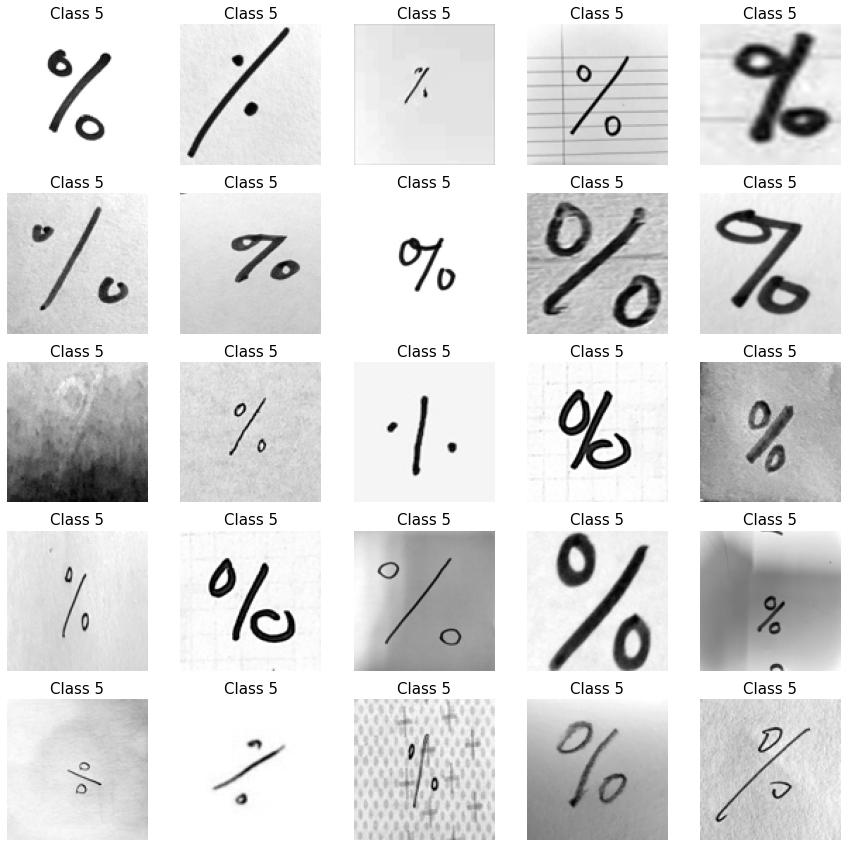

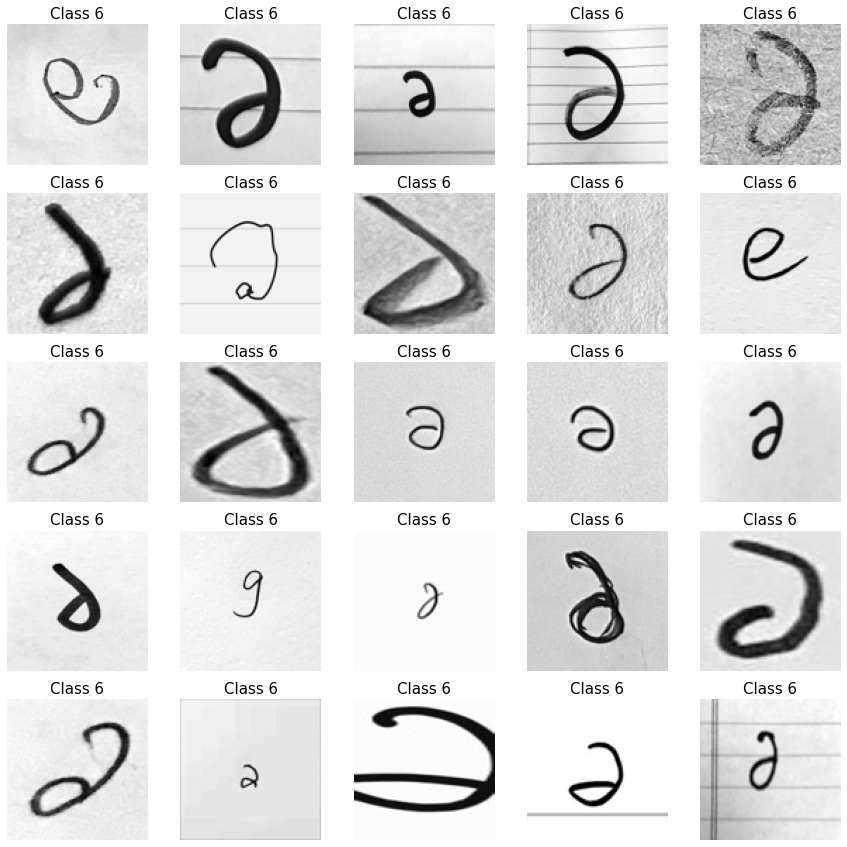

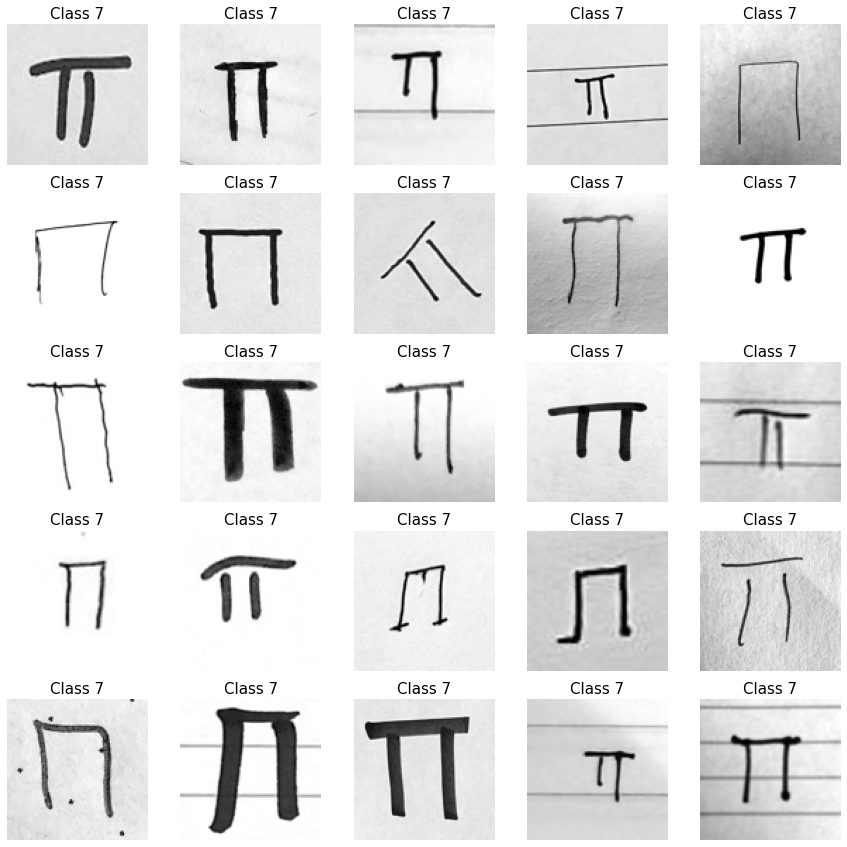

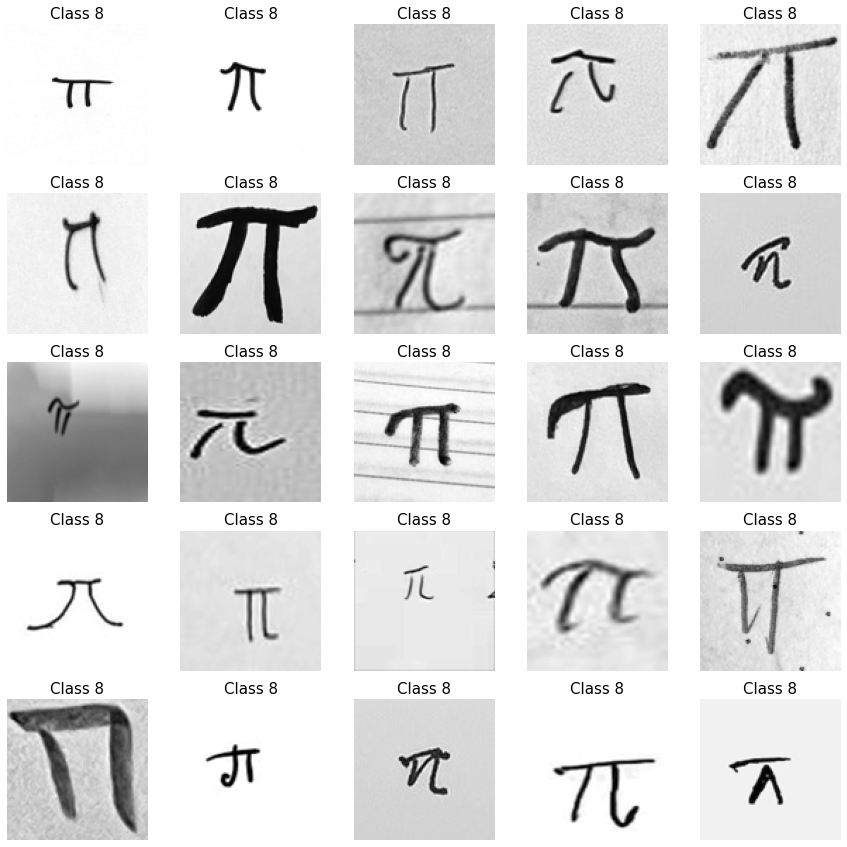

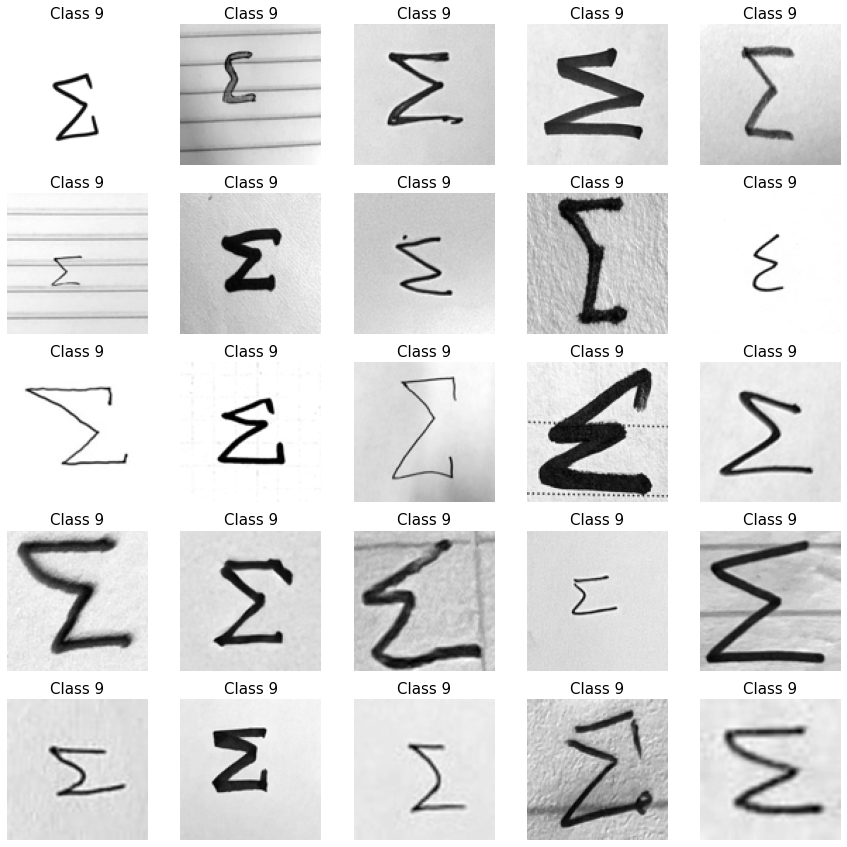

In [ ]:
for i in range(0,10):
    rnd_sample = np.random.permutation(np.where(t_train==i)[0])
    fig=plt.figure(figsize=(15,15))
    for j in range(25):
        fig.add_subplot(5,5,j+1)
        im = X[rnd_sample[j],:]
        plt.imshow(X[rnd_sample[j],:].reshape((100,100)),cmap='gray')
        plt.axis('off');plt.title('Class '+str(int(t_train[rnd_sample[j]])),size=15)
    plt.show()
    print('\n\n')

In [ ]:
def Label_preprocessing(X,t_train):
  lst =np.where(t_train<0)[0]
  x,t=[],[]
  c=0
  for i in range(len(t_train)):
    if i in lst:
      x.append(X[i])
      t.append(int(10))
      c+=1
    else:
      x.append(X[i])
      t.append(t_train[i])
  print("Total number of labels which were reassigned with a new label due to label assignment of -1",c)
  return np.array(x),np.array(t)


In [ ]:
X,t_train=Label_preprocessing(X,t_train)

Total number of labels which were reassigned with a new label due to label assignment of -1 235


In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X,t_train,shuffle=True,stratify=t_train,test_size=0.2,random_state=42)

In [ ]:
X_test,X_val,y_test,y_val = train_test_split(X_test,y_test,shuffle=True,stratify=y_test,test_size=0.1,random_state=42)

### Image Saving

In [ ]:
def folder_structure():
  ls1=['train','test','val']
  ls2=['x', 'sqaure root', 'plus sign', 'negative sign','equal', 'precent', 'partial', 'product', 'pi', 'summation','others']
  fp1='Data'
  fp2='math_symbols'
  os.mkdir(fp1)
  if os.path.exists(fp1) == True:
    train_dir = os.path.join(fp1, fp2)
    os.mkdir(train_dir)
    for i in range(len(ls1)):
      train_dir=fp1+'/'+fp2
      train_dir = os.path.join(train_dir, ls1[i])
      os.mkdir(train_dir)
      for j in range(len(ls2)):
        train_dir=fp1+'/'+fp2+'/'+str(ls1[i])
        train_dir = os.path.join(train_dir, ls2[j])
        os.mkdir(train_dir)

In [ ]:
def folder_structure_cond():
   pth = 'Data/math_symbols'
   if os.path.exists(pth) == True:
     print("Folder structure already present")
   else:
      folder_structure()

In [ ]:
def Image_Saver(X_train, y_train, ch):
    pth = 'Data/math_symbols'
    data_label_counts = collections.defaultdict(lambda : 0)
    for i in range(len(X_train)):
        ls2 = ['x', 'sqaure root', 'plus sign', 'negative sign', 'equal', 'precent', 'partial', 'product', 'pi',
               'summation','others']
        pth = 'Data/math_symbols/' + str(ch)
        tmp = np.array(X_train[i])
        img = np.reshape(tmp, (100, 100))
        label = ls2[int(y_train[i])]
        if y_train[i] == int(0):
            pth = pth + '/' + label + '/' + str(data_label_counts[label]) + '.jpg'
            cv2.imwrite(pth, img)
        elif y_train[i] == int(1):
            pth = pth + '/' + label + '/' + str(data_label_counts[label]) + '.jpg'
            cv2.imwrite(pth, img)
        elif y_train[i] == int(2):
            pth = pth + '/' + label + '/' + str(data_label_counts[label]) + '.jpg'
            cv2.imwrite(pth, img)
        elif y_train[i] == int(3):
            pth = pth + '/' + label + '/' + str(data_label_counts[label]) + '.jpg'
            cv2.imwrite(pth, img)
        elif y_train[i] == int(4):
            pth = pth + '/' + label + '/' + str(data_label_counts[label]) + '.jpg'
            cv2.imwrite(pth, img)
        elif y_train[i] == int(5):
            pth = pth + '/' + label + '/' + str(data_label_counts[label]) + '.jpg'
            cv2.imwrite(pth, img)
        elif y_train[i] == int(6):
            pth = pth + '/' + label + '/' + str(data_label_counts[label]) + '.jpg'
            cv2.imwrite(pth, img)
        elif y_train[i] == int(7):
            pth = pth + '/' + label + '/' + str(data_label_counts[label]) + '.jpg'
            cv2.imwrite(pth, img)
        elif y_train[i] == int(8):
            pth = pth + '/' + label + '/' + str(data_label_counts[label]) + '.jpg'
            cv2.imwrite(pth, img)
        elif y_train[i] == int(9):
            pth = pth + '/' + label + '/' + str(data_label_counts[label]) + '.jpg'
            cv2.imwrite(pth, img)
        elif y_train[i] == int(10):
            pth = pth + '/' + label + '/' + str(data_label_counts[label]) + '.jpg'
            cv2.imwrite(pth, img)
        data_label_counts[label] += 1

In [ ]:
folder_structure_cond()

Folder structure already present


In [ ]:
Image_Saver(X_train,y_train,ch='train')

In [ ]:
Image_Saver(X_test,y_test,ch='test')

In [ ]:
Image_Saver(X_val,y_val,ch='val')

### Training RESNET-101 model

In [ ]:
data_transforms = {
    'train': transforms.Compose([
        transforms.ToTensor()
    ]),
    'test': transforms.Compose([
        transforms.ToTensor()
    ]),
    'val': transforms.Compose([
        transforms.ToTensor()
    ]),
}

In [ ]:
data_dir = 'Data/math_symbols'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train','test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=0)
              for x in ['train','test']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train','test']}
class_names = image_datasets['train'].classes

print(class_names)

['equal', 'negative sign', 'others', 'partial', 'pi', 'plus sign', 'precent', 'product', 'sqaure root', 'summation', 'x']


In [ ]:
def imshow(inp, title):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    plt.imshow(inp)
    plt.title(title)
    plt.show()


In [ ]:
def torch_integer_conv(arr):
    res=[]
    for i in arr:
        i = i .to("cpu")
        i = i.numpy()
        res.append(int(i))
    return np.array(res)
        

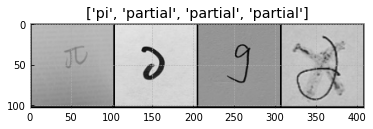

In [ ]:
# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    ep,acc1,acc2,loss1,loss2=[],[],[],[],[]
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        ep.append(epoch)

        # Each epoch has a training and validation phase
        for phase in ['train','test']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        optimizer.zero_grad()
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))
            
            if phase == 'train':
                 loss1.append(epoch_loss)
                 acc1.append(epoch_acc*100)
                
            elif phase == 'test':
                 loss2.append(epoch_loss)
                 acc2.append(epoch_acc*100)

            # deep copy the model
            if phase == 'test' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best test Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model,acc1,acc2,np.array(loss1),np.array(loss2),np.array(ep)

In [ ]:
import time

In [ ]:
model = models.resnet101(pretrained=True)
num_ftrs = model.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model.fc = nn.Linear(num_ftrs, 11)

model = model.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer = optim.SGD(model.parameters(), lr=0.001)

step_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

model,acc1,acc2,loss1,loss2,epochs = train_model(model, criterion, optimizer, step_lr_scheduler, num_epochs=26)

Epoch 0/25
----------
train Loss: 0.9950 Acc: 0.7078
test Loss: 0.2705 Acc: 0.9145

Epoch 1/25
----------
train Loss: 0.4224 Acc: 0.8796
test Loss: 0.2151 Acc: 0.9391

Epoch 2/25
----------
train Loss: 0.2895 Acc: 0.9239
test Loss: 0.1944 Acc: 0.9502

Epoch 3/25
----------
train Loss: 0.2090 Acc: 0.9442
test Loss: 0.1846 Acc: 0.9619

Epoch 4/25
----------
train Loss: 0.1610 Acc: 0.9568
test Loss: 0.1911 Acc: 0.9600

Epoch 5/25
----------
train Loss: 0.1133 Acc: 0.9711
test Loss: 0.1862 Acc: 0.9569

Epoch 6/25
----------
train Loss: 0.0888 Acc: 0.9785
test Loss: 0.2279 Acc: 0.9588

Epoch 7/25
----------
train Loss: 0.0739 Acc: 0.9833
test Loss: 0.2225 Acc: 0.9594

Epoch 8/25
----------
train Loss: 0.0646 Acc: 0.9864
test Loss: 0.2151 Acc: 0.9643

Epoch 9/25
----------
train Loss: 0.0545 Acc: 0.9887
test Loss: 0.1996 Acc: 0.9643

Epoch 10/25
----------
train Loss: 0.0547 Acc: 0.9884
test Loss: 0.2073 Acc: 0.9656

Epoch 11/25
----------
train Loss: 0.0534 Acc: 0.9891
test Loss: 0.2162 Acc

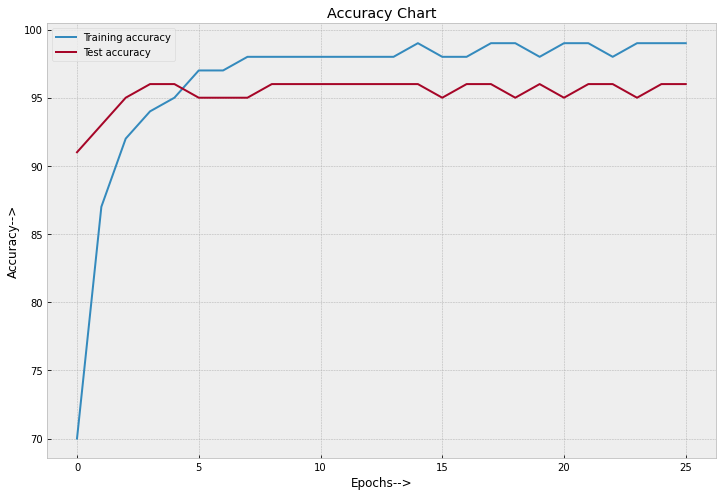

In [ ]:
acc1 = torch_integer_conv(acc1)
acc2 = torch_integer_conv(acc2)
plt.figure(figsize =(12, 8))
plt.grid(visible=True)
plt.plot(epochs,acc1, label='Training accuracy')
plt.plot(epochs,acc2, label='Test accuracy')
plt.title('Accuracy Chart')
plt.xlabel('Epochs-->')
plt.ylabel('Accuracy-->')
plt.legend()
plt.savefig('Accuracy.png');

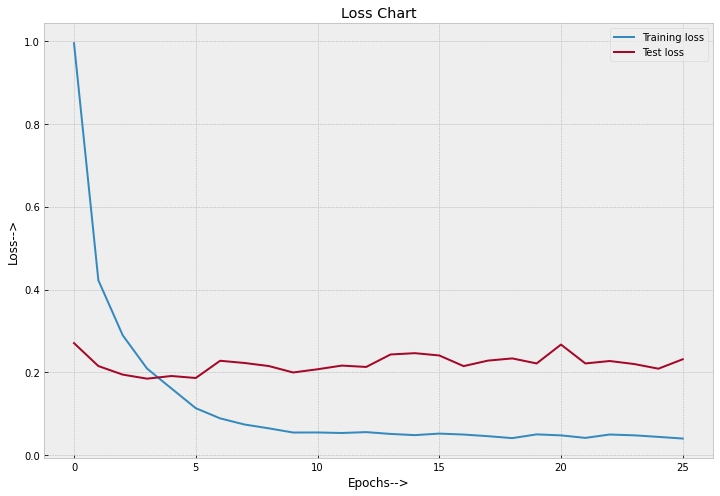

In [ ]:
plt.figure(figsize =(12, 8))
plt.grid(visible=True)
plt.plot(epochs,loss1, label='Training loss')
plt.plot(epochs,loss2, label='Test loss')
plt.title('Loss Chart')
plt.xlabel('Epochs-->')
plt.ylabel('Loss-->')
plt.legend()
plt.savefig('Loss.png');

In [ ]:
print("Model's state_dict:")
for param_tensor in model.state_dict():
    print(param_tensor, "\t", model.state_dict()[param_tensor].size())

Model's state_dict:
conv1.weight 	 torch.Size([64, 3, 7, 7])
bn1.weight 	 torch.Size([64])
bn1.bias 	 torch.Size([64])
bn1.running_mean 	 torch.Size([64])
bn1.running_var 	 torch.Size([64])
bn1.num_batches_tracked 	 torch.Size([])
layer1.0.conv1.weight 	 torch.Size([64, 64, 1, 1])
layer1.0.bn1.weight 	 torch.Size([64])
layer1.0.bn1.bias 	 torch.Size([64])
layer1.0.bn1.running_mean 	 torch.Size([64])
layer1.0.bn1.running_var 	 torch.Size([64])
layer1.0.bn1.num_batches_tracked 	 torch.Size([])
layer1.0.conv2.weight 	 torch.Size([64, 64, 3, 3])
layer1.0.bn2.weight 	 torch.Size([64])
layer1.0.bn2.bias 	 torch.Size([64])
layer1.0.bn2.running_mean 	 torch.Size([64])
layer1.0.bn2.running_var 	 torch.Size([64])
layer1.0.bn2.num_batches_tracked 	 torch.Size([])
layer1.0.conv3.weight 	 torch.Size([256, 64, 1, 1])
layer1.0.bn3.weight 	 torch.Size([256])
layer1.0.bn3.bias 	 torch.Size([256])
layer1.0.bn3.running_mean 	 torch.Size([256])
layer1.0.bn3.running_var 	 torch.Size([256])
layer1.0.bn3.num

In [ ]:
print("Optimizer's state_dict:")
for var_name in optimizer.state_dict():
    print(var_name, "\t", optimizer.state_dict()[var_name])

Optimizer's state_dict:
state 	 {0: {'momentum_buffer': None}, 1: {'momentum_buffer': None}, 2: {'momentum_buffer': None}, 3: {'momentum_buffer': None}, 4: {'momentum_buffer': None}, 5: {'momentum_buffer': None}, 6: {'momentum_buffer': None}, 7: {'momentum_buffer': None}, 8: {'momentum_buffer': None}, 9: {'momentum_buffer': None}, 10: {'momentum_buffer': None}, 11: {'momentum_buffer': None}, 12: {'momentum_buffer': None}, 13: {'momentum_buffer': None}, 14: {'momentum_buffer': None}, 15: {'momentum_buffer': None}, 16: {'momentum_buffer': None}, 17: {'momentum_buffer': None}, 18: {'momentum_buffer': None}, 19: {'momentum_buffer': None}, 20: {'momentum_buffer': None}, 21: {'momentum_buffer': None}, 22: {'momentum_buffer': None}, 23: {'momentum_buffer': None}, 24: {'momentum_buffer': None}, 25: {'momentum_buffer': None}, 26: {'momentum_buffer': None}, 27: {'momentum_buffer': None}, 28: {'momentum_buffer': None}, 29: {'momentum_buffer': None}, 30: {'momentum_buffer': None}, 31: {'momentum_b

In [ ]:
print('Finished Training')
device = torch.device("cpu")
model.to(device)
PATH = './PGB-ResNet-101.pth'
torch.save(model, PATH)

Finished Training


### Validation Results

In [ ]:
PATH = './PGB-ResNet-101.pth'
model = torch.load(PATH)

In [ ]:
data_dir = 'Data/math_symbols'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=0)
              for x in ['val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['val']}
class_names = image_datasets['val'].classes

print(class_names)

['equal', 'negative sign', 'others', 'partial', 'pi', 'plus sign', 'precent', 'product', 'sqaure root', 'summation', 'x']


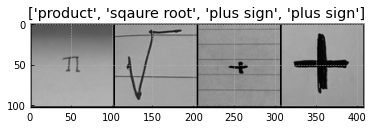

In [ ]:
# Get a batch of training data
inputs, classes = next(iter(dataloaders['val']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [ ]:
avg=[]
for phase in ['val']:
  model.eval()   # Set model to evaluate mode
  iter=0
  for inputs, labels in dataloaders[phase]:
      inputs = inputs.to(device)
      labels = labels.to(device)
      outputs = model(inputs)
      _, predicted = torch.max(outputs, 1)
    
      labels =labels.to("cpu")
      pred = predicted.to("cpu")
      labels =labels.numpy()
      pred =pred.numpy()
      acc = 100.0 * accuracy_score(labels,pred)
      avg.append(acc)
      print('Validation Accuracy of the network for iteration {0}: {1} %'.format(iter,acc))
      iter+=1
  print("Average Validation Accuracy of the network",sum(avg)//iter)
 


Validation Accuracy of the network for iteration 0: 100.0 %
Validation Accuracy of the network for iteration 1: 100.0 %
Validation Accuracy of the network for iteration 2: 100.0 %
Validation Accuracy of the network for iteration 3: 100.0 %
Validation Accuracy of the network for iteration 4: 100.0 %
Validation Accuracy of the network for iteration 5: 100.0 %
Validation Accuracy of the network for iteration 6: 100.0 %
Validation Accuracy of the network for iteration 7: 100.0 %
Validation Accuracy of the network for iteration 8: 50.0 %
Validation Accuracy of the network for iteration 9: 100.0 %
Validation Accuracy of the network for iteration 10: 100.0 %
Validation Accuracy of the network for iteration 11: 75.0 %
Validation Accuracy of the network for iteration 12: 100.0 %
Validation Accuracy of the network for iteration 13: 100.0 %
Validation Accuracy of the network for iteration 14: 50.0 %
Validation Accuracy of the network for iteration 15: 100.0 %
Validation Accuracy of the network fo